#   Constant Elasticity Variance Process

The purpose of this notebook is to provide an illustration of the [Constant Elasticity Variance Process](https://en.wikipedia.org/wiki/Constant_elasticity_of_variance_model) and some of its main properties. 

Before diving into the theory, let's start by loading the libraries

-  `matplotlib`  
-  [`aleatory`](https://github.com/quantgirluk/aleatory) 
  
  
together with the style sheet [Quant-Pastel Light](https://github.com/quantgirluk/matplotlib-stylesheets). 

These tools will help us to make insightful visualisations.

In [1]:
import matplotlib.pyplot as plt
mystyle = "https://raw.githubusercontent.com/quantgirluk/matplotlib-stylesheets/main/quant-pastel-light.mplstyle"
plt.style.use(mystyle)
plt.rcParams["figure.figsize"] = (12, 6)

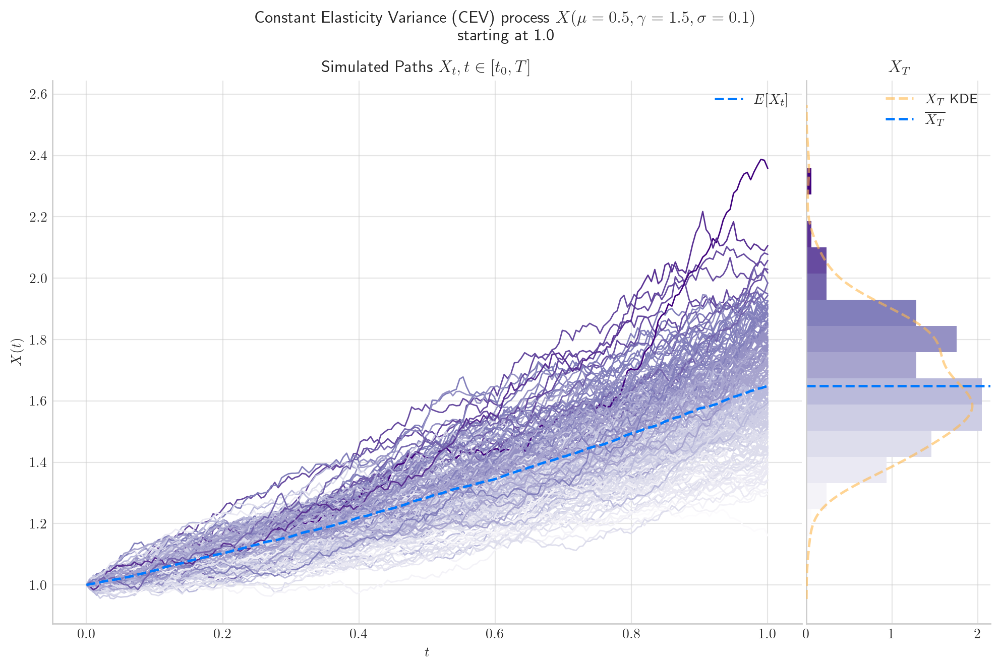

In [2]:
from aleatory.processes import CEVProcess

process = CEVProcess()
fig = process.draw(n=200, N=200, figsize=(12, 7), colormap="Purples")

## Definition

The Constant Elasticity Variance (CEV) process can be used to describe the dynamics of forward prices via a stochastic process which can be defined by the following Stochastic Differential Equation (SDE)


\begin{equation}
dX_t = \mu X_t dt + \sigma X_t^{\gamma} dW_t, \quad t >0,
\end{equation}


with initial condition  $X_0 =x_0\in\mathbb{R}$, and where $W_t$ is a standard Brownian motion, and the three parameters are constants:

- $\mu \in \mathbb{R}$ : drift
- $\sigma>0$ : scale
- $\gamma$ : elasticity parameter 

Another parameterisation is given by
\begin{equation}
dX_t = \mu X_t dt + \sigma X_t^{\gamma + 1} dW_t, \quad t >0.
\end{equation}

### Special Cases 


- If $\gamma=0$, then the CEV model reduces to a Geometric Brownian motion
- If $\gamma=-\frac{1}{2}$, then we have a particular case of the CIR process

## Existence 


If $\mu =0$, then we have

$$ dX_t = \sigma X_t^{\gamma +1 } dW_t, \ \ \ \ t >0.$$

## Expectation and Variance

For each $t>0$, the conditional marginal $X_t|X_0$ from a CIR process satisfy 

\begin{equation*}
\mathbf{E}[X_t] = \mathbb{E}[X_t|X_0]=  x_0e^{-\theta t} +  \mu(1- e^{-\theta t}),
\end{equation*}

and

\begin{equation*}
\mathbf{Var} [X_t ] = \mathbb{Var} [X_t |X_0] = \dfrac{\sigma^2}{\theta} x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu \sigma^2}{2\theta}(1 - e^{ -\theta t} )^2.
\end{equation*}

In order to verify this, let us introduce the function $f(t,x) = x e^{\theta t}$. Note that this is exactly the same function that we used to find the solution of the SDE associated to the Vasicek process. Then, Ito's formula implies


\begin{align*}
X_te^{\theta t} &= x_0 +\int_0^t X_s \theta e^{\theta s}ds + \int_0^t e^{\theta s}dX_s \\
&= x_0 +\int_0^t X_s \theta e^{\theta s}ds + \int_0^t e^{\theta s}[\theta (\mu - X_s) ds + \sigma \sqrt{X_s} dW_s], \\
& = x_0 + \int_0^t \left[ \theta X_s  e^{\theta s}  +\theta e^{\theta s}(\mu - X_s)\right] ds + \int_0^t e^{\theta s}\sigma\sqrt{X_s} dW_s\\
& = x_0 + \int_0^t \left[ \theta e^{\theta s}\mu\right] ds + \int_0^t e^{\theta s}\sigma \sqrt{X_s} dW_s\\
& = x_0 + \mu(e^{\theta t} - 1) + \int_0^t e^{\theta s}\sigma \sqrt{X_s} dW_s.
\end{align*}


Thus

\begin{equation}
X_t = x_0e^{-\theta t} +  \mu(1- e^{-\theta t})  + \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s.
\end{equation}

```{note}
📝 We have not solve the equation explicitely since $X_s$ is still present in the integral with respect to the Brownian motion.
However, this expression allows us to calculate the conditional expectation and variance of the marginal $X_t$.
```

To calculate the expectation of $X_t$ we  simply use the linearity of the expectation and the fact that the Ito integral is a martingale. This allows us to obtain:
\begin{equation*}
\mathbf{E} [X_t] = x_0e^{-\theta t} +  \mu(1- e^{-\theta t}).
\end{equation*}

```{note}
📝 This expectation is equal to the one obtained for the Vasicek process marginals. Later we will see that the marginals follow different distributions. 
```

For the variance, we have
\begin{align*}
\mathbf{Var} [X_t] &=   \mathbf{E}[X_t^2] - \mathbf{E}[X_t]^2 \\
 & =   \mathbf{E} \left[ \left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) + \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s \right)^2 \right]  - \left( x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)^2\\
& =\left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)^2 +  2 \mathbf{E} \left[\left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)  \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s  \right ]  + \sigma^2 \mathbf{E} \left[ \left( \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s \right)^2 \right] \\
& \ \  - \left( x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)^2\\
&= 2 \mathbf{E} \left[\left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)  \sigma \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s  \right ]  + \sigma^2 \mathbf{E} \left[ \left( \int_0^t e^{-\theta (t-s)}  \sqrt{X_s} dW_s \right)^2 \right] \\
&= 2 \left(x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right)e^{-\theta t}  \sigma\mathbf{E} \left[ \int_0^t e^{\theta s}  \sqrt{X_s} dW_s  \right ]  + \sigma^2 \mathbf{E} \left[  \int_0^t e^{-2\theta (t-s)}  X_s ds  \right],
\end{align*}
where the last equality follows by taking all non-stochastic terms out of the expectation in the first term and using the isommetry property of the Ito integral in the second term. Next, we use the fact that the two Ito integrals w.r.t. Brownian motion are martingales to obtain
\begin{align*}
\mathbf{Var} [X_t] &= \sigma^2 e^{-2\theta t}\mathbf{E} \left[  \int_0^t e^{-2\theta s}  X_s ds  \right]\\
&= \sigma^2 e^{-2\theta t} \int_0^t e^{2\theta s} \mathbf{E} \left[  X_s  \right] ds\\
&= \sigma^2 e^{-2\theta t} \int_0^t e^{2\theta s}  \left[   x_0e^{-\theta s} +  \mu(1- e^{-\theta s}) \right] ds\\
&= \sigma^2 e^{-2\theta t} \int_0^t [  (x_0 - \mu) e^{\theta s} + \mu e^{ 2\theta s} ]ds\\
&= \sigma^2 e^{-2\theta t} \left[ (x_0 - \mu) \dfrac{1}{\theta}(e^{\theta t} -1 ) + \dfrac{1}{2 \theta} \mu (e^{ 2\theta t} -1 ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ (x_0 - \mu) (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{1}{2 } \mu (1 -e^{ -2\theta t}  ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu}{2}(2e^{ -2\theta t}  - 2e^{-\theta t}  +1 -e^{ -2\theta t}  ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu}{2}(e^{ -2\theta t}  - 2e^{-\theta t}  +1  ) \right]\\
&= \dfrac{\sigma^2}{\theta} \left[ x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu}{2}(1 - e^{ -\theta t} )^2 \right]\\
&= \dfrac{\sigma^2}{\theta} x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu \sigma^2}{2\theta}(1 - e^{ -\theta t} )^2.
\end{align*}

```{note}
📝 The second term in the last expression is equal to the variance of the marginal from a  Vasicek process multiplied by $\mu$. 
```

### Python Implementation

For given $x_0, \theta>0, \mu, \sigma>0$ and $t>0$ we can implement the above formulas for the expectation, and variance, as follows. 

In [1]:
import numpy as np

x0 = 2.0
theta = 1.0
mu = 3.0
sigma = 0.5
t= 1.0

exp = x0*np.exp(-1.0*theta*t) +  mu*(1.0 - np.exp(-1.0*theta*t))
var = (sigma**2/theta)*x0*(np.exp(-1.0*theta*t)- np.exp(-2.0*theta*t)) + (mu*sigma**2/(2.0*theta))*(1 - np.exp(-1.0*theta*t))**2 

print(f'For x_0={x0}' , f'theta={theta}',f'mu={mu}', f'sigma=.{sigma}', f't={t}', sep=", ")
print(f'E[X_t] = {exp: .6f}')
print(f'Var[X_t] = {var :.6f}')

For x_0=2.0, theta=1.0, mu=3.0, sigma=.0.5, t=1.0
E[X_t] =  2.632121
Var[X_t] = 0.266113


## Marginal Distributions

The marginal distribution $X_t | x_0$ , simply denoted by $X_t$, has probability density function

\begin{equation}
f(x, t; \theta, \mu, \sigma, x_0) =  \dfrac{e^{\theta t}}{2 c(t)}   \left(\dfrac{x e^{\theta t}}{x_0}\right)^{\frac{\nu}{2}}   \exp\left(- \dfrac{x_0 + xe^{\theta t}}{2c(t)}\right) I_{\nu} \left( \dfrac{1}{c(t)}  \sqrt{x_0 x e^{\theta t}}\right) \mathbb{1}_{\{x>0\}},
\end{equation}
where where $I_{\nu}$ is the [modified Bessel function](https://mathworld.wolfram.com/ModifiedBesselFunctionoftheFirstKind.html), and 

$$ c(t) = \dfrac{\sigma^2}{4 \theta} (e^{\theta t} - 1),$$

and 

$$\nu = \dfrac{2 \theta  \mu}{\sigma^2} - 1.$$


Then the random variable $Y_t = X_t \dfrac{e^{\theta t}}{c(t)}$ has density 

\begin{align*}

g(y) & = c(t) e^{-\theta t } f(yc(t)e^{-\theta t}  ) \\
& = \dfrac{1}{2} \exp \left\{-\frac{1}{2}{\left(y+\dfrac{x_0}{c(t)}\right)}\right\}\left(\dfrac{yc(t)}{x_0}\right)^{\frac{\nu}{2}}I_{\nu}(\sqrt{\dfrac{x_0}{c(t)} y}),\\
& = \dfrac{1}{2} e^{\frac{-(y+\alpha)}{2}}\left(\dfrac{y}{\alpha}\right)^{\frac{\delta}{4}- \frac{1}{2} }I_{\frac{\delta}{2} - 1}\left(\sqrt{\alpha y}\right),
\end{align*}

where 
\begin{equation*}
\delta = 2(\nu + 1),
\end{equation*}

and 

\begin{equation*}
\alpha = \dfrac{x_0}{c(t)}.
\end{equation*}

That is, $Y_t$ follows a [non-central Chi-squared](https://en.wikipedia.org/wiki/Noncentral_chi-squared_distribution) distribution 
\begin{equation}
Y_t = X_t \dfrac{e^{\theta t}}{c(t)} \sim \chi^2(\delta, \alpha).
\end{equation}

So, $X_t$ follows a non-central Chi-square distribution (with  $\delta$ degrees of freedom,  non-centrality parameter equal to $\alpha$)  scaled by $scale = c(t)e^{-\theta t}$.  Note that we can write these quantities  in terms of the SDE parameters initial condition as follows:

\begin{equation}
\delta = \dfrac{4 \theta \mu}{\sigma^2},
\end{equation}

\begin{equation}
\alpha = \dfrac{4 \theta }{\sigma^2 }\dfrac{x_0}{(e^{\theta t} - 1)},
\end{equation}


\begin{equation}
scale = \dfrac{\sigma^2}{4 \theta} (1 -e^{-\theta t}).
\end{equation}

```{note}
- The number of  degrees of freedom $\delta$ does not depend on the initial condition $x_0$. Moreover, $\delta$ does not depend on $t$! which means that the number of degrees of freedom remains constant as the process evolves.
- The non-centrality parameter $\alpha$ does not depend on the long-term mean $\mu$.
- The scale depends neither on the long-term mean  $\mu$  nor on the initial condition $x_0$.
```

### Marginal Distributions in Python

We can implement the marginal distributions in `Python` by using equations (5.9) to (5.12) which tells us that $X_t$ follows a scaled non-central chi-squared distribution. One way to do this is by using the object  `ncx2`  from the library `scipy.stats`.  The next cell shows how to create $X_1$ using this method.

In [2]:
from scipy.stats import ncx2
import numpy as np 

x0 = 2.0 
theta = 1.0
mu = 3.0
sigma = 0.5
t =1.0 

delta = 4.0 * theta * mu / sigma**2
alpha = (4.0 * theta * x0) / (sigma**2 * (np.exp(theta*t)-1.0))
scale = (sigma**2 / 4.0 * theta) * (1.0 - np.exp(-1.0*theta*t))
X_1 = ncx2(df=delta,nc=alpha,scale=scale)


# Now we can calculate the mean and the variance of X_1
print(X_1.mean()) 
print(X_1.var())

2.632120558828558
0.2661132293025628


Another way to do this is by creating an object  `CIR` from `aleatory.processes` and calling the method `get_marginal` on it. The next cell shows how to create the marginal $X_1$ using this method.

In [3]:
from aleatory.processes import CIRProcess

x0 = 2.0 
theta = 1.0
mu = 3.0
sigma = 0.5
t =1.0 

process = CIRProcess(theta=theta, mu=mu, sigma=sigma, initial=x0)
X_1 = process.get_marginal(t=1)

# Now we can calculate the mean and the variance of X_1
print(X_1.mean())
print(X_1.var())

2.632120558828558
0.2661132293025628


Hereafter, we will use the latter method to create marginal distributions from the CIR process.

### Probability Density Functions

The probability density function (pdf) of the marginal distribution $X_t$ given $x_0>0$, is given by equation (5.7)

Let's take a look at the density function of $X_1$ for different values of $\theta$, $\mu$, and $\sigma$.

In [21]:
import matplotlib.pyplot as plt

In [22]:
plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)
%config InlineBackend.figure_format ='retina'

First we consider the process
`CIRProcess(theta=1.5, mu=1.0, sigma=1.0, initial=2.0)` and plot the marginal density of $X_1$. Note how the mean is still far from the long term mean $\mu$.

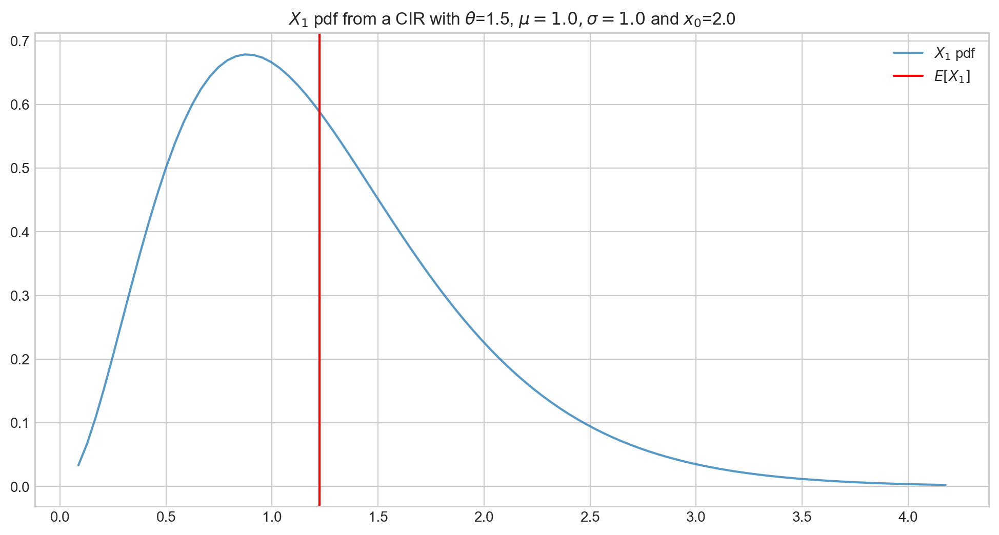

In [118]:
process = CIRProcess(theta=1.5, mu=1.0, sigma=1.0, initial=2.0)
X_1 = process.get_marginal(t=1)
x = np.linspace(X_1.ppf(0.001), X_1.ppf(0.999), 100)
plt.plot(x, X_1.pdf(x), '-', lw=1.5, alpha=0.75, label=f'$X_1$ pdf')
plt.axvline(x = X_1.mean(), color='red', label='$E[X_1]$')
plt.title(r'$X_1$ pdf from a CIR with $\theta$=1.5, $\mu = 1.0, \sigma=1.0$ and $x_0$=2.0')
plt.legend()
plt.show()

Next we vary the value of the parameter $\theta$ (the speed of reversion)  ``CIRProcess(theta, mu=1.0, sigma=1.0, initial=2.0)`` and plot the corresponding densities of $X_1$. 


Note that the change in the value of  $\theta$ impacts both the mean and the variance of the density. 

As $\theta$ increases:

-  The expectation goes from being close to the initial point $x_0 = 2.0$ to being close to the long term mean $\mu=1.0$.
-  The variance decreases and the distribution becomes more concentrated.
-  Both the degrees of freedom and the non-centrality parameters increase. We can see this by observing how the shape of the density changes becoming more symmetric. 
-  The scale decreases. 


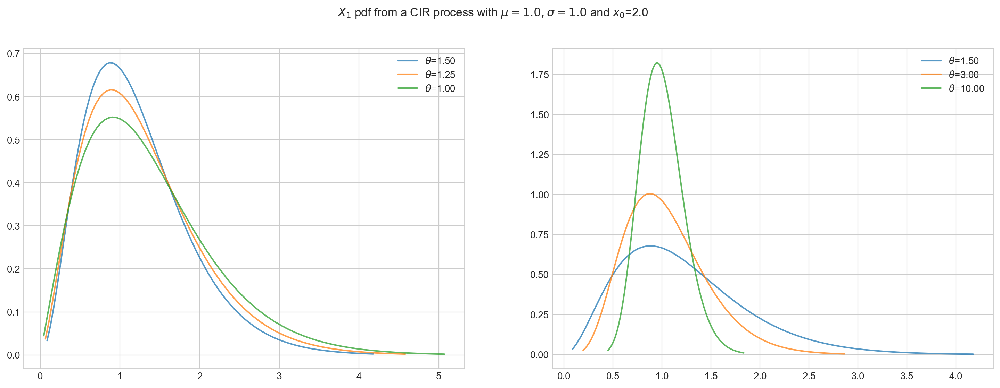

In [126]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
theta_values = ( [1.5, 1.25, 1.], [1.5, 3.0, 10])
for (thetas, ax) in zip(theta_values, axs):
    for theta in thetas:
        process = CIRProcess(theta=theta, mu=1.0, sigma=1.0, initial=2.0)
        X_t = process.get_marginal(t=1.0)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.999), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$\\theta$={theta:.2f}')
        ax.legend()
fig.suptitle(r'$X_1$ pdf from a CIR process with $\mu = 1.0, \sigma=1.0$ and $x_0$=2.0')
plt.show()

Next we vary the value of the parameter $\mu$ (the long term mean) in  a `CIRProcess(theta=1.5, mu=mu, sigma=1.0, initial=2.0)` and again plot the densities corresponding to $X_1$. 

As $\mu$ increases:

- The mean of the density follows the direction of the parameter $\mu$ which is expected since it will converge to it when $t$ goes to infinity.
- The variance increases and the density becomes wider
- The degrees of freedom increase, and the density becomes more symmetric

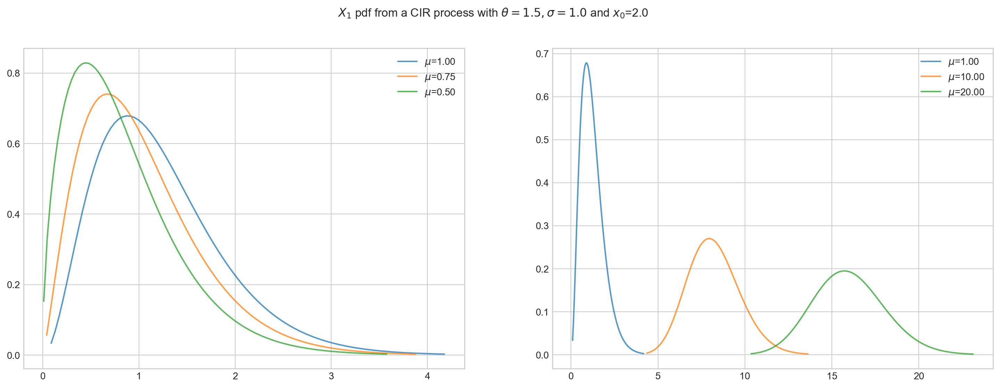

In [103]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
mu_values = ([1, 0.75, 0.5,], [1, 10, 20])
for (mus, ax) in zip(mu_values, axs):
    for mu in mus:
        # process = CIRProcess(theta=1.0, mu=mu, sigma=0.5, initial=1.0)
        process = CIRProcess(theta=1.5, mu=mu, sigma=1.0, initial=2.0)
        X_t = process.get_marginal(t=1.0)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.999), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$\mu$={mu:.2f}')
        ax.legend()
fig.suptitle(r'$X_1$ pdf from a CIR process with $\theta = 1.5, \sigma=1.0$ and $x_0$=2.0')
plt.show()


Next we vary the value of the parameter $\sigma$ (the volatility) in  `CIRProcess(theta=1.5, mu=1.0, sigma=sigma, initial=2.0)` and again plot the densities of $X_1$.

As $\sigma$ increases: 

- The mean remains constant
- The variance of $X_1$ increasesand the distribution becomes wider. We can see this by looking at the range in the x-axis of the plots.
- The degrees of freedom decrease. The density becomes more asymmetric. 
- The non-centrality parameter decreases and the scale increases

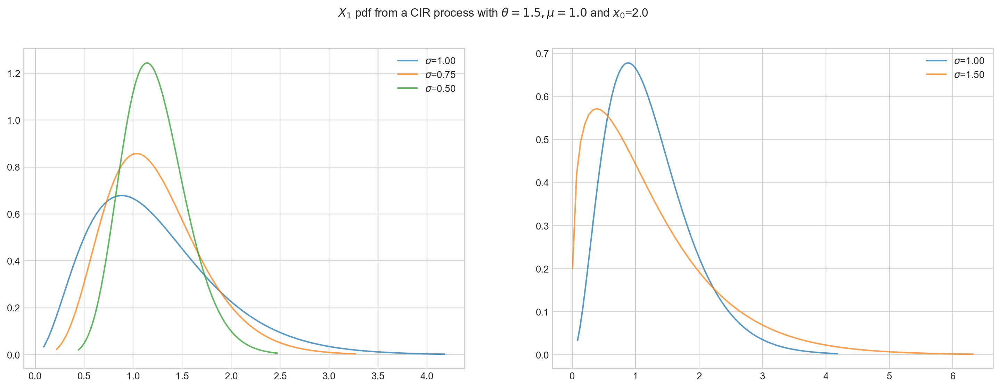

In [127]:
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
sigma_values = ([1, 0.75, 0.5], [1, 1.5])
for (sigmas, ax) in zip(sigma_values, axs):
    for sigma in sigmas:
        # process = CIRProcess(theta=1.0, mu=10.0, sigma=sigma, initial=1.0)
        process = CIRProcess(theta=1.5, mu=1.0, sigma=sigma, initial=2.0)
        X_t = process.get_marginal(t=1.0)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.999), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$\sigma$={sigma:.2f}')
        ax.legend()
fig.suptitle(r'$X_1$ pdf from a CIR process with $\theta = 1.5, \mu=1.0$ and $x_0$=2.0')
plt.show()


Finally, we will keep all parameters fixed as `CIRProces(theta=1.5, mu=1.0, sigma=1.0, initial=2.0)` and plot the densities of $X_t$ for a range of $t$ values.

As $t$ increases:

-  The expectation goes from being close to the initial point $x_0 = 2.0$ to being close to the long term mean $\mu=1.0$.
-  The variance also increases but note that it stabilises as convergence happens.
-  The degrees of freedom remain constant
-  The non-centrality parameter tend to zero
-  The scale converges to a constant

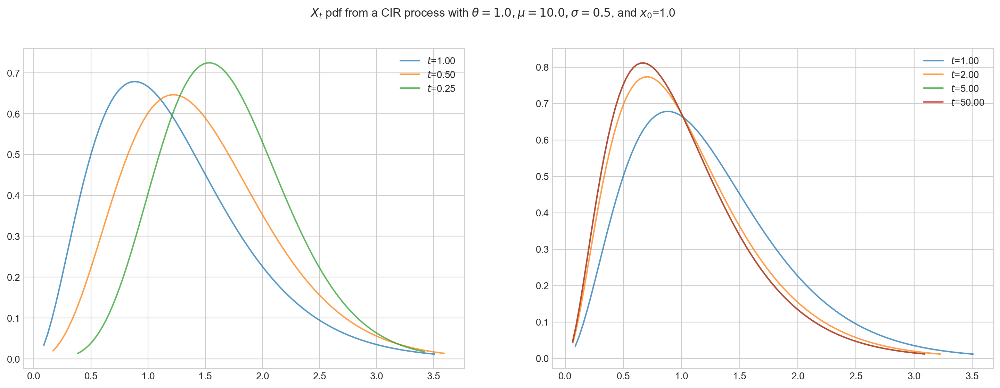

In [113]:
process = CIRProcess(theta=1.5, mu=1.0, sigma=1.0, initial=2.0)
fig, axs = plt.subplots(1, 2, figsize=(18, 6))
t_values = ([1.0, 0.5, 0.25], [1.0, 2, 5, 50])
for (ts, ax) in zip(t_values, axs):
    for t in ts:
        X_t = process.get_marginal(t=t)
        x = np.linspace(X_t.ppf(0.001), X_t.ppf(0.995), 100)
        ax.plot(x, X_t.pdf(x), '-', lw=1.5,
                alpha=0.75, label=f'$t$={t:.2f}')
        ax.legend()
fig.suptitle(r'$X_t$ pdf from a CIR process with $\theta = 1.0, \mu=10.0, \sigma=0.5$, and $x_0$=1.0')
plt.show()


### Sampling

Now, let's see how to get a random sample from $X_t$ for any  $t>0$. 

The next cell shows how to get a sample of size 5 from $X_1$.

In [28]:
from aleatory.processes import CIRProcess

process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0)
X_1= process.get_marginal(t=1.0)
X_1.rvs(size=5)

array([5.3698625 , 6.10048599, 7.4370113 , 7.20332363, 6.4392991 ])

Similarly, we can get a sample from $X_{10}$

In [29]:
X_10 = process.get_marginal(t=10)
X_10.rvs(size=5)

array([11.40026252,  8.54885104,  9.37029522, 12.31838833,  9.39123132])

## Simulation


In order to simulate paths from a stochastic process, we need to set a discrete partition over an interval for the simulation to take place. 

For simplicity, we are going to consider an equidistant partition of size $n$ over $[0,T]$, i.e.:
\begin{equation*}
t_i = \frac{i}{n-1} T \qquad  \hbox{for } i = 0, \cdots, n-1.
\end{equation*}
Then, the goal is to simulate a path of the form $\{ X_{t_i} , i=0,\cdots, n-1\}$. We will use Euler-Maruyama approximation.

### Simulating and Visualising Paths

We can simulate several paths from a Vasicek process and visualise them we can use the method `plot` from the `aleatory` library. 


Let's simulate 10 paths over the interval $[0,1]$ using a partition of 100 points. 



`````{admonition} Tip
:class: tip
Remember that  the number of points in the partition is defined by the parameter $n$, while  the number of paths is determined by $N$.
`````

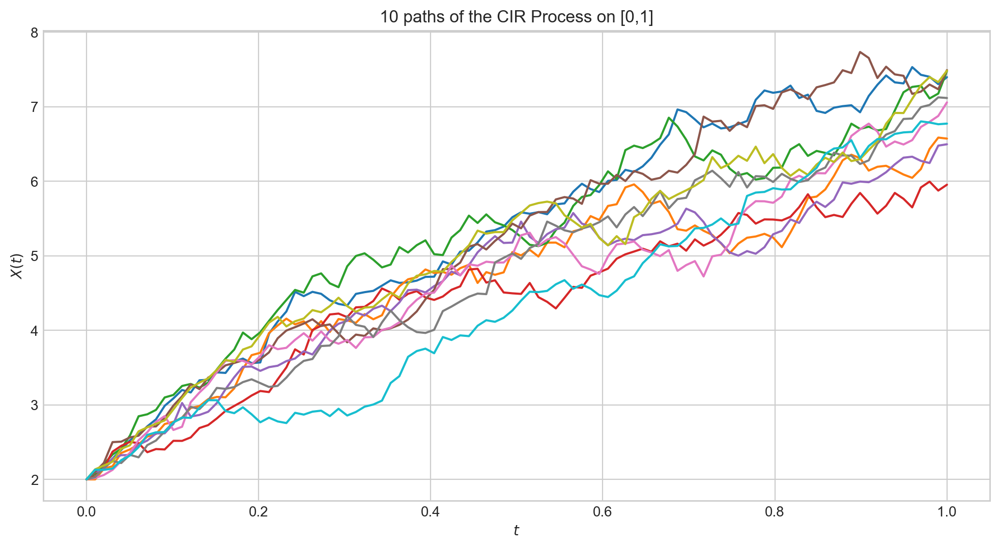

In [30]:
from aleatory.processes import CIRProcess

process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=2.0)
process.plot(n=100, N=10, title='10 paths of the CIR Process on [0,1]')
plt.show()

```{note}
In all plots we are using a linear interpolation to draw the lines between the simulated points. 
```

Similarly, we can define the process over the interval $[0, 5]$ and simulate 50 paths with a partition of size 100.

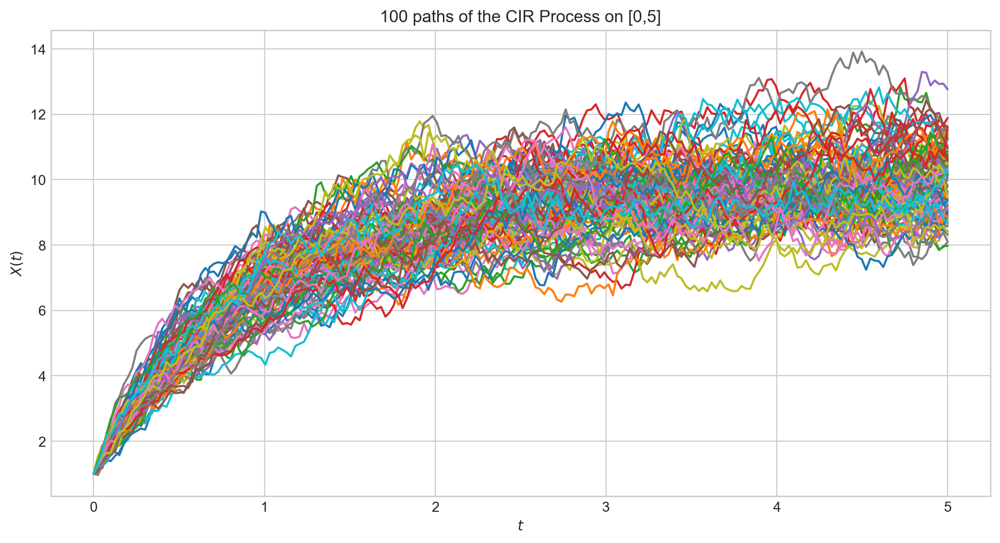

In [31]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=0.5, initial=1.0, T=5.0)
process.plot(n=200, N=100, title='100 paths of the CIR Process on [0,5]')
plt.show()

## Long Time Behaviour 

### Expectation and Variance


\begin{equation*}
\lim_{t\rightarrow\infty}  \mathbf{E} [X_t ]  = \lim_{t\rightarrow\infty} \left[ x_0e^{-\theta t} +  \mu(1- e^{-\theta t}) \right] = \mu.
\end{equation*}
and
\begin{equation*}
\lim_{t\rightarrow\infty}\mathbf{Var} [X_t ]  = \lim_{t\rightarrow\infty} \dfrac{\sigma^2}{\theta} x_0  (e^{ -\theta t} - e^{ -2\theta t} ) + \dfrac{\mu \sigma^2}{2\theta}(1 - e^{ -\theta t} )^2 =  \frac{\mu  \sigma^2}{ 2\theta}.
\end{equation*}

Next, we illustrate the convergence of both the mean and the variance as $t$ grows. Note that the speed of convergence is determined by the parameter $\theta$.
First, we consider a process with $\theta = 0.10$.

In [205]:
def draw_mean_variance(x0, theta, mu, sigma, T=100):

    process = CIRProcess(theta=theta, mu=mu, sigma=sigma, initial=x0, T=T)
    ts = np.linspace(0.1, T, T)
    means = process.marginal_expectation(ts)
    # variances = process.marginal_variance(ts)
    variances = [process.get_marginal(t).var() for t in ts]
    fig, (ax1, ax2,) = plt.subplots(1, 2, figsize=(9, 4))
    
    ax1.plot(ts, means, lw=1.5, color='black', label='$E[X_t]$')
    ax1.set_xlabel('t')
    ax1.legend()
    ax2.plot(ts,  variances, lw=1.5, color='red', label='$Var[X_t]$')
    # var_limit = (mu*sigma**2)/(2.0*theta)
    # ax2.axhline(y=var_limit)
    ax2.set_xlabel('t')
    ax2.legend()
    fig.suptitle(
        'Expectation and Variance of $X_t$ with ' f'$x_0$={x0:.2f}, $\\theta$={theta:.2f}, $\mu$={mu:.2f}, $\sigma$={sigma:.2f}', size=12)
    plt.show()

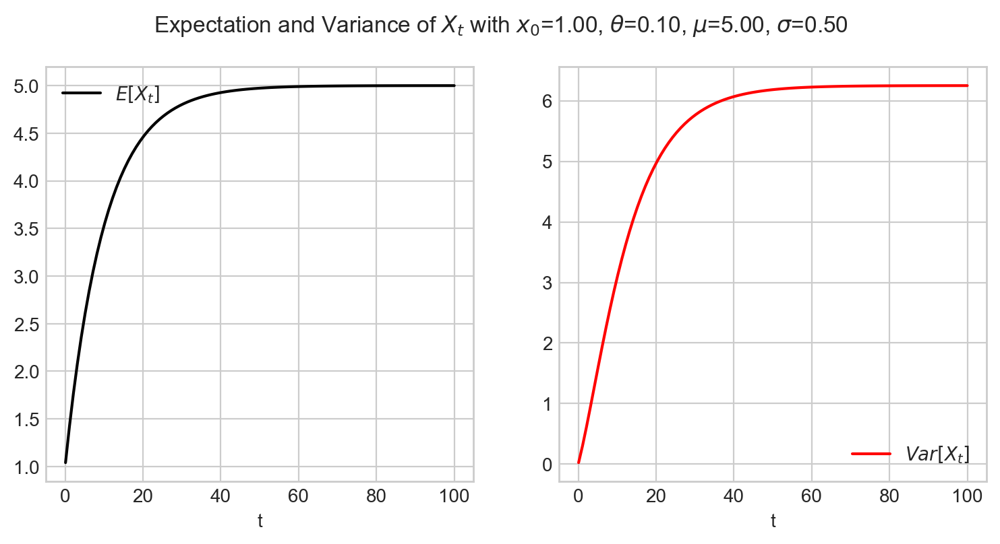

In [206]:
draw_mean_variance(theta=0.1, mu=5.0, sigma=0.5, x0=1.0, T=100)

Now, we chage the speed parameter to be $\theta = 1$ (i.e. 10 times bigger than before) and plot both the expectation and the variance over the same time interval.
Clearly, convergence is achieved much faster. Besides, the limit variance is different.

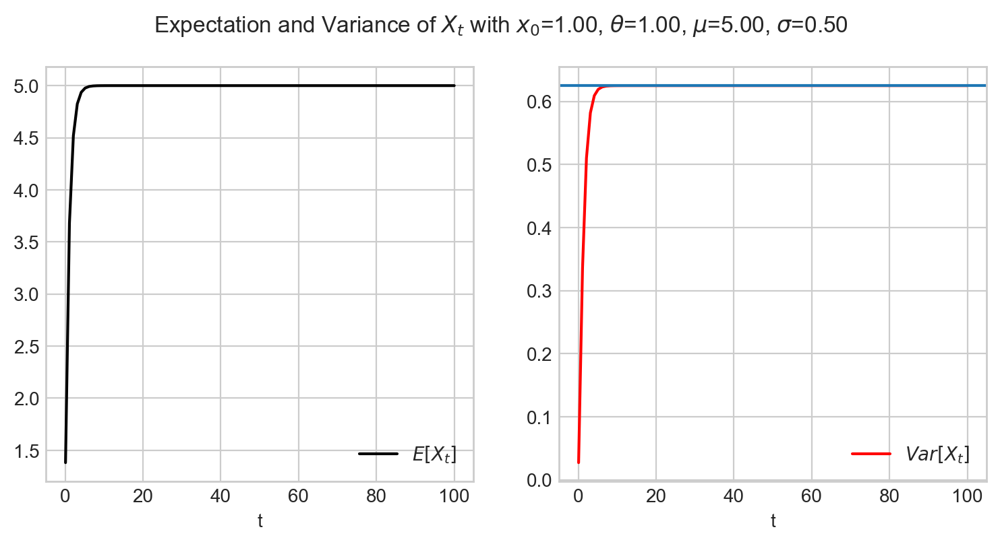

In [204]:
draw_mean_variance(theta=1.0, mu=5.0, sigma=0.5, x0=1.0, T=100)

### What about $\delta, \alpha$ and $scale$?

\begin{equation}
\lim_{t\rightarrow\infty} \delta =  \lim_{t\rightarrow\infty} \dfrac{4 \theta \mu}{\sigma^2} = \dfrac{4 \theta \mu}{\sigma^2},
\end{equation}

\begin{equation}
\lim_{t\rightarrow\infty} \alpha = \lim_{t\rightarrow\infty}\dfrac{4 \theta }{\sigma^2 }\dfrac{x_0}{(e^{\theta t} - 1)} = 0,
\end{equation}


\begin{equation}
\lim_{t\rightarrow\infty} scale = \lim_{t\rightarrow\infty} \dfrac{\sigma^2}{4 \theta} (1 -e^{-\theta t}) =  \dfrac{\sigma^2}{4 \theta}.
\end{equation}

In [195]:
def draw_alpha_scale(x0, theta, mu, sigma, T=100):

    ts = np.linspace(0.1, T, T)
    alphas = (4*theta/sigma**2)*(x0/(np.exp(theta*ts) - 1.0))
    scales = sigma**2/4*theta*(1-np.exp(-1.0*theta*ts))

    fig, (ax1, ax2,) = plt.subplots(1, 2, figsize=(9, 4))
    
    ax1.plot(ts, alphas, lw=1.5, color='blue',  label=r"$\alpha$")
    ax1.set_xlabel('t')
    ax1.legend()
    ax2.plot(ts,  scales, lw=1.5, color='magenta', label='$scale$')
    ax2.set_xlabel('t')
    ax2.legend()
    fig.suptitle(
        'Degrees of Freedom and Scale Convergence for $X_t$ \n from a CIR process with ' f'$x_0$={x0:.2f}, $\\theta$={theta:.2f}, $\mu$={mu:.2f}, $\sigma$={sigma:.2f}', size=12)
    plt.show()

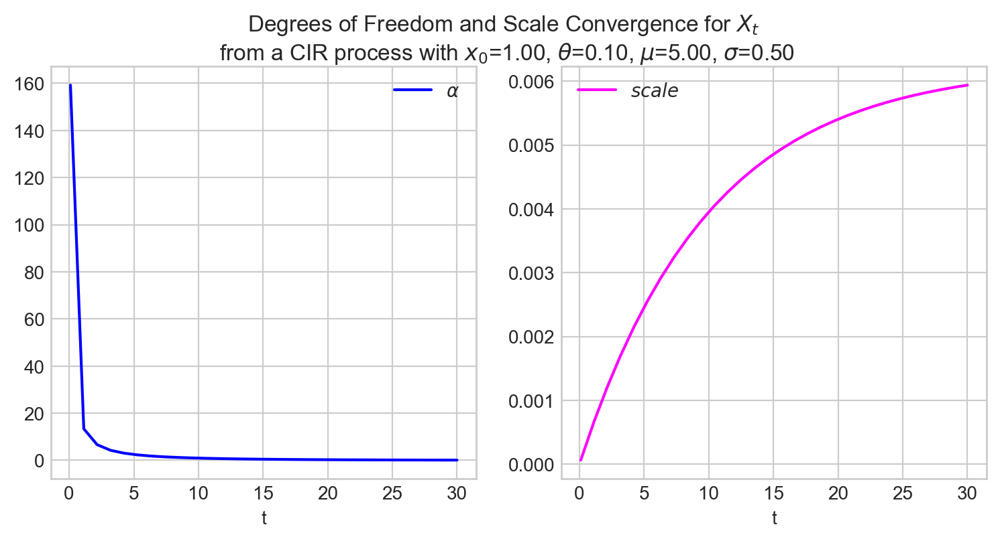

In [196]:
draw_alpha_scale(x0=1.0, theta=0.1, mu=5.0, sigma=0.5, T=30)

### Marginal

Equations (5.7)-(5.10) together with (5.11)-(5.13) imply that distribution $X_t$ given an initial point $x_0$, converges to 
\begin{equation*}
X_{\infty}\dfrac{\sigma^2}{4\theta} \sim \chi^2\left(\dfrac{4\theta\mu}{\sigma^2}, 0\right),
\end{equation*}
as $t$ goes to infinity. Let's make some simulations to illustrate this convergence.


First, we simulate 1000 paths from `CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)` over the interval $[0,1]$. Here, we can see the the distribution of $X_1$ has mean around 6.0. This means that the process has not reached convergence, since we have not arrived to the long term mean $\mu=10.0$. 

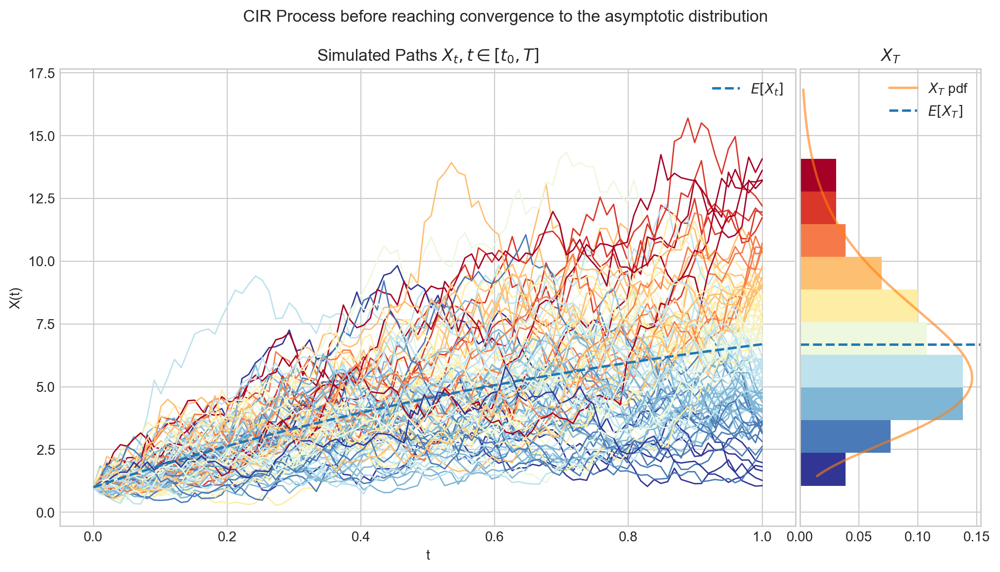

In [194]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process before reaching convergence to the asymptotic distribution')
plt.show()

Now, we simulate 1000 paths from the same process `CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=15)` but this time over the interval $[0,15]$. In the picture, we can see the the distribution of $X_{15}$ has mean equal to the long term mean $\mu=10$. The expectation has reached convergence!

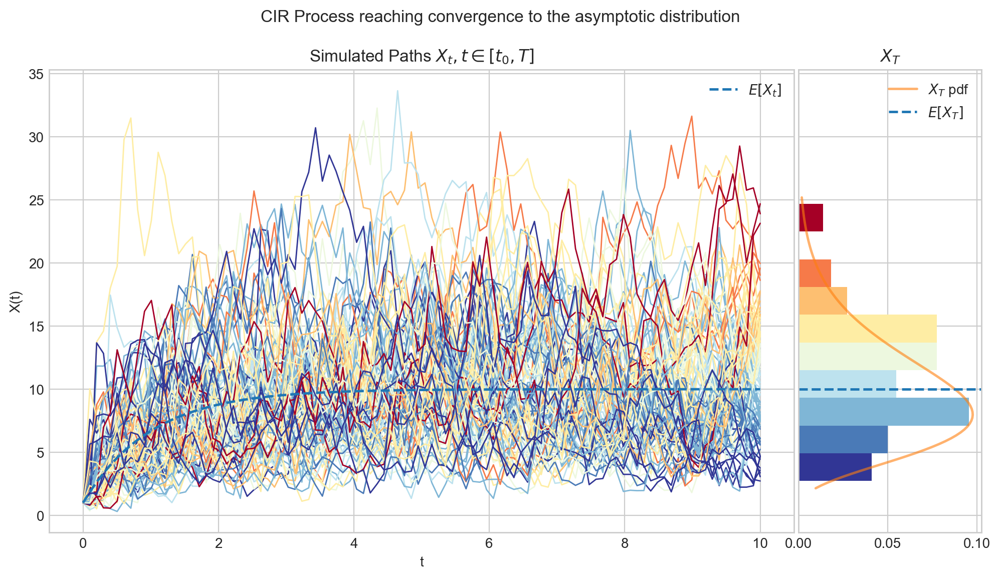

In [159]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=10.0)
process.draw(n=100, N=100, title='CIR Process reaching convergence to the asymptotic distribution')
plt.show()

#### The parameter $\theta$ determines the Speed of Convergence

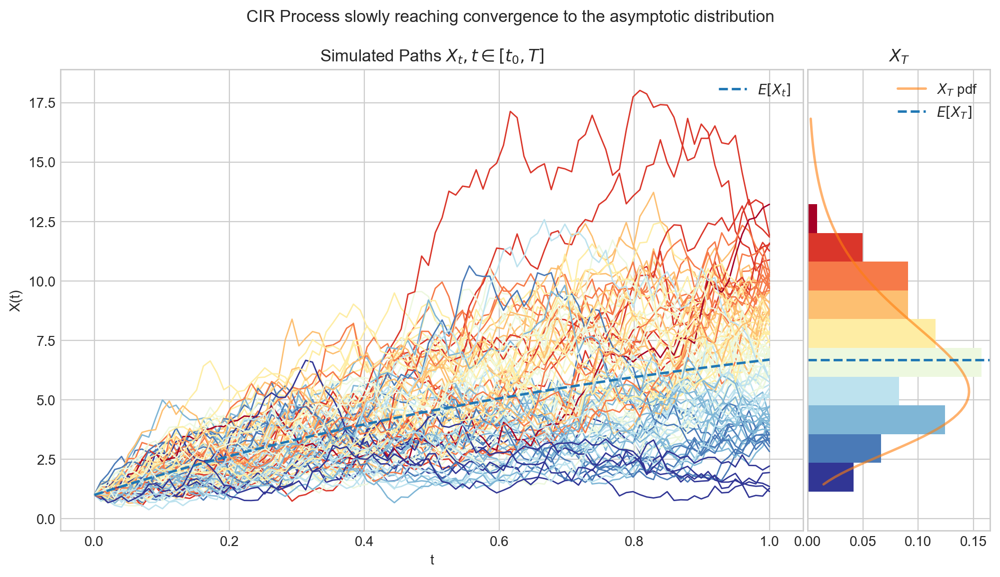

In [44]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process slowly reaching convergence to the asymptotic distribution')
plt.show()

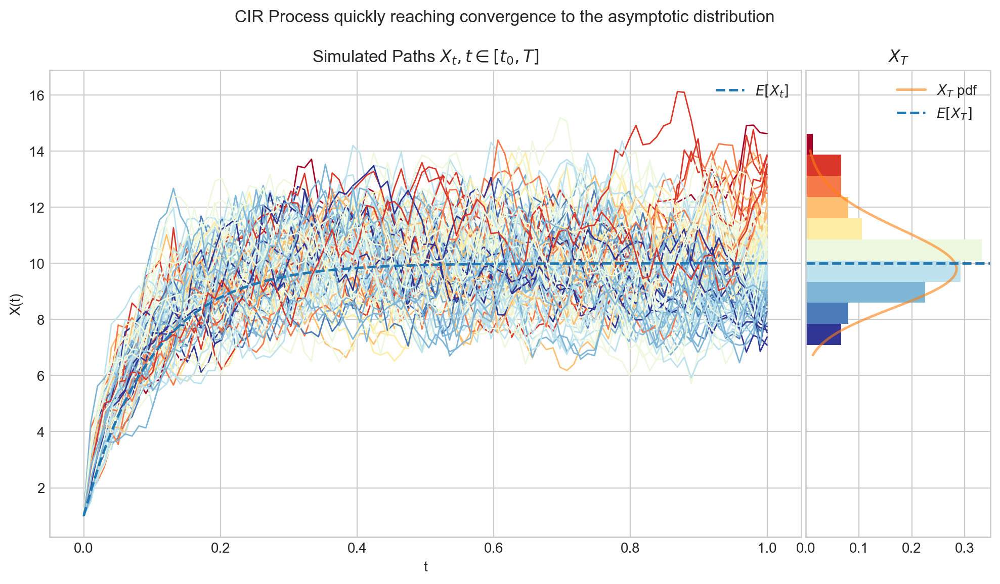

In [43]:
process = CIRProcess(theta=10.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process quickly reaching convergence to the asymptotic distribution')
plt.show()

#### The parameter $\sigma$ determines the volatility in the simulation

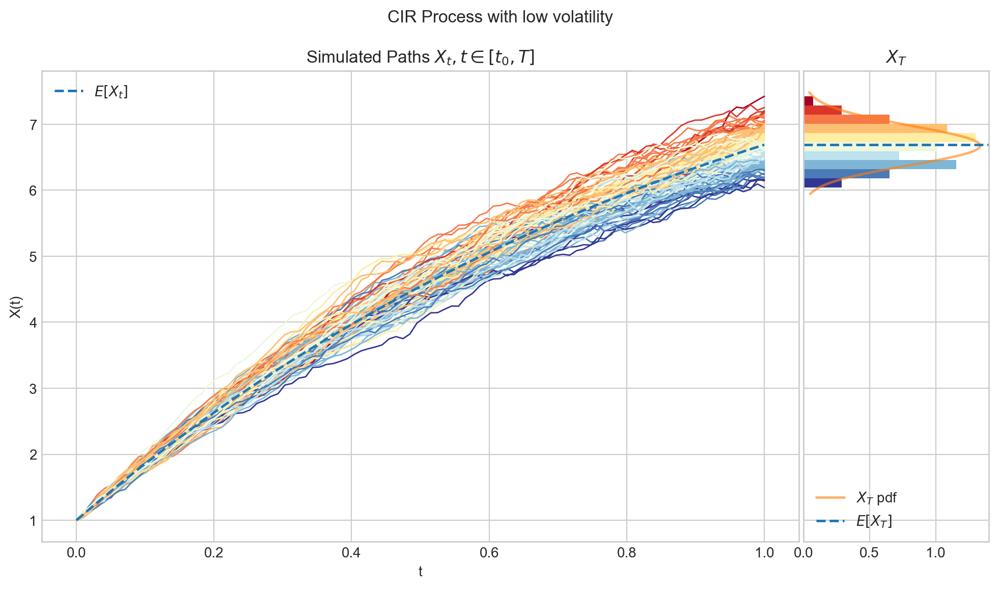

In [45]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=0.2, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process with low volatility')
plt.show()

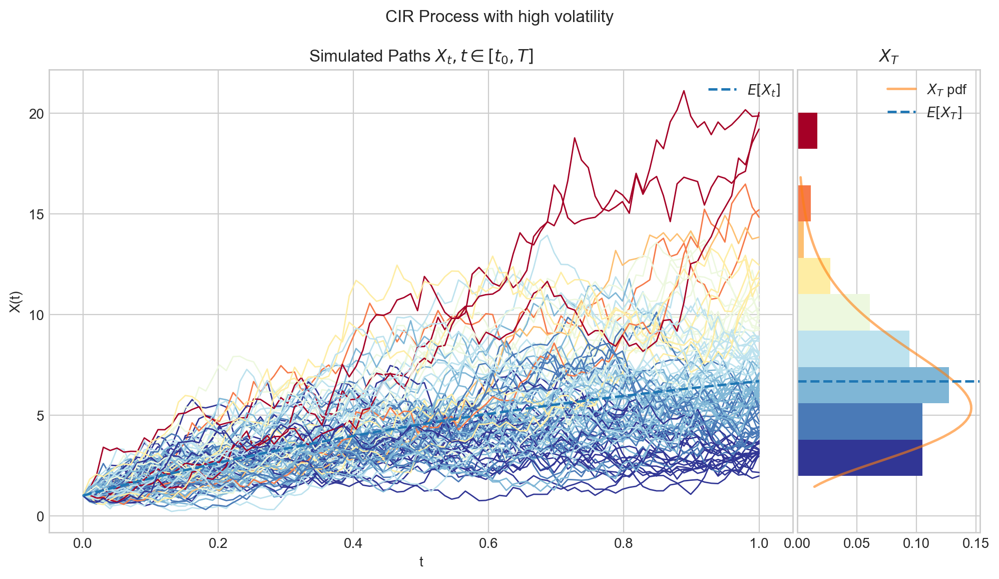

In [46]:
process = CIRProcess(theta=1.0, mu=10.0, sigma=2.0, initial=1.0, T=1.0)
process.draw(n=100, N=100, title='CIR Process with high volatility')
plt.show()

## Visualisation

To finish this note, let's take a final look at a some simulations from the CIR process.

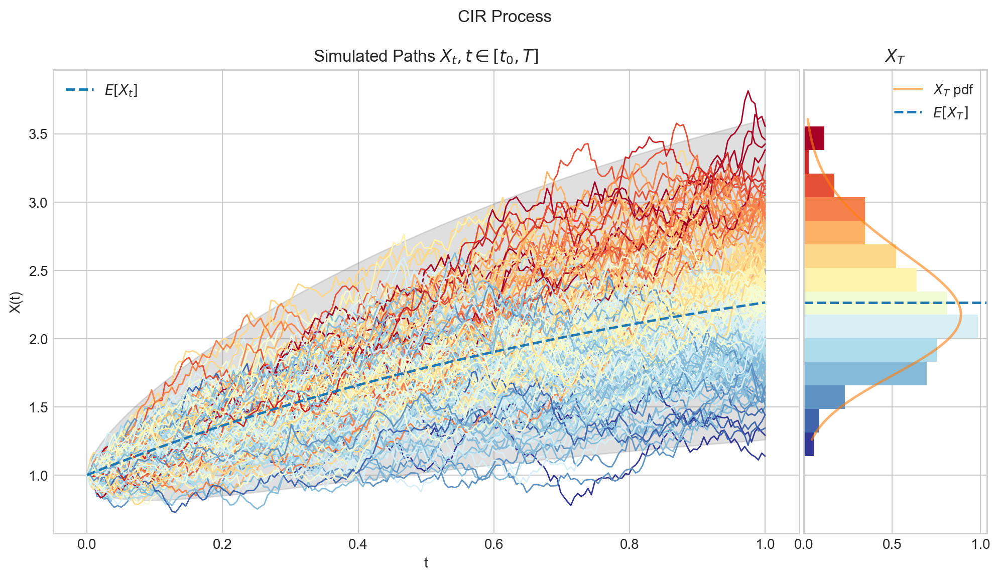

In [47]:
from aleatory.processes import CIRProcess
process = CIRProcess(theta=1.0, mu=3.0, sigma=0.5, initial=1.0, T=1.0)
process.draw(n=200, N=200, envelope=True)
plt.show()

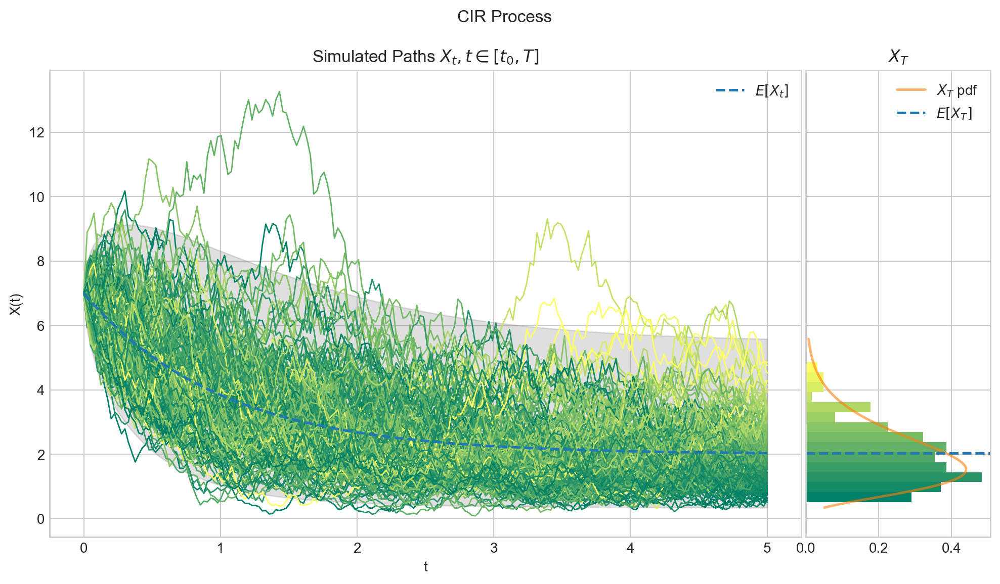

In [21]:
from aleatory.processes import Vasicek
process = CIRProcess(theta=1.0, mu=2.0, sigma=1.0, initial=7.0, T=5.0)
process.draw(n=200, N=200, envelope=True, colormap="summer", title='CIR Process')
plt.show()

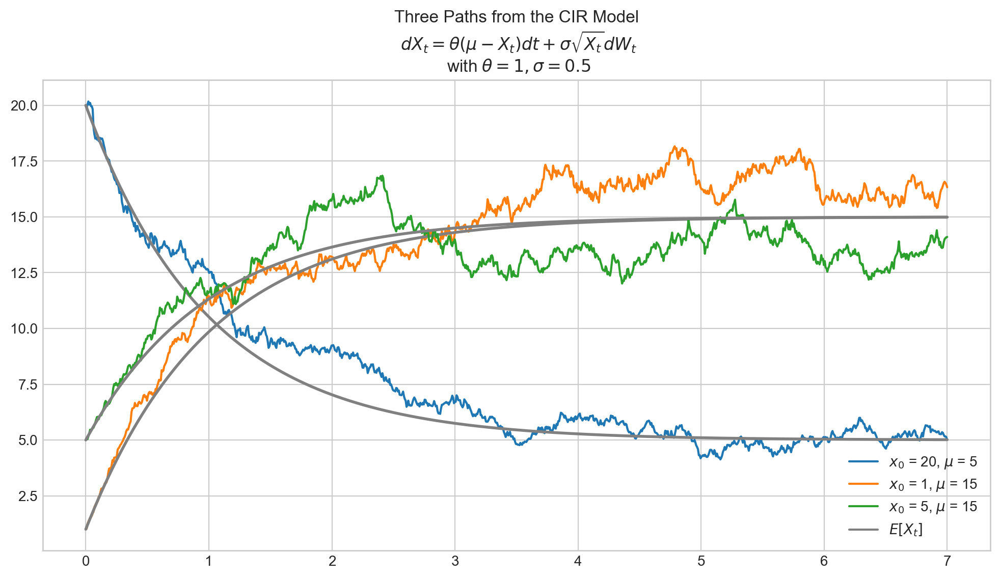

In [10]:
from aleatory.processes import CIRProcess
import matplotlib.pyplot as plt
import numpy as np

process = CIRProcess(theta=1.0, mu=5.0, sigma=0.5, initial=20.0, T=7.0)
path = process.simulate(n=1000, N=1)
ts = process.times
exp = process.marginal_expectation(ts)
plt.plot(ts, path[0], label= f'$x_0$ = 20, $\mu$ = 5')
plt.plot(ts, exp, color='grey',linewidth=2)

for x0 in [1.0, 5.0]:
    process = CIRProcess(theta=1.0, mu=15.0, sigma=0.5, initial=x0, T=7.0)
    path = process.simulate(n=1000, N=1)
    plt.plot(ts, path[0], label= f'$x_0$ = {x0:.0f}, $\mu$ = 15')
    exp = process.marginal_expectation(ts)
    plt.plot(ts, exp, color='grey', linewidth=2)
plt.plot(ts, exp, color='grey', label=f'$E[X_t]$')
plt.legend()
plt.title('Three Paths from the CIR Model\n $dX_t = \\theta(\mu - X_t) dt + \sigma \sqrt{X_t} dW_t$\n with $\\theta = 1, \sigma = 0.5$')
plt.show()

## References and Further Reading

- "Mathematical Methods for Financial Markets" by Monique Jeanblanc, Marc Yor, Marc Chesney; Springer Science & Business Media, 13 Oct 2009

